In [39]:
import netCDF4
import itertools

from tqdm import tqdm

import sys

Nx = 512
Ny = 512

def tau_1(arr_orig, tau, z, counter):
    
    z_tau_1 = np.zeros((Nx, Ny))
    
    for i, j in tqdm(itertools.product(range(Nx), range(Ny)), desc = str(counter)):
        
        idx_tau_1 = np.argmin(abs(tau[:, j, i] - 1.0))
        
        z_tau_1[i, j] = z[idx_tau_1, j, i]
        
#    print(z_tau_1)
    
    mean_z_tau_1 = np.mean(z_tau_1)
    
#    print(mean_z_tau_1)
        
    z_orig = np.arange(0, len(arr_orig[0, 0, :])) * 10.0
    
#    print(z_orig)
    
    idx_z_orig = np.argmin(abs(z_orig - mean_z_tau_1))
    
#    print(idx_z_orig)
    
#    sys.exit()
        
    return arr_orig[:, :, idx_z_orig]

T_ssd_orig_1d = np.fromfile('./ssd/eosT.222809.bin', dtype = np.float32)
p_ssd_orig_1d = np.fromfile('./ssd/eosP.222809.bin', dtype = np.float32)

T_300_orig_1d = np.fromfile('./300G/eosT.627321.bin', dtype = np.float32)
p_300_orig_1d = np.fromfile('./300G/eosP.627321.bin', dtype = np.float32)

T_ssd_orig = T_ssd_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))
p_ssd_orig = p_ssd_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))

T_300_orig = T_300_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))
p_300_orig = p_300_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))

T_ssd = np.zeros((Nx, Ny))
p_ssd = np.zeros((Nx, Ny))

T_300 = np.zeros((Nx, Ny))
p_300 = np.zeros((Nx, Ny))
    
z = np.array(netCDF4.Dataset('./ssd/222809/10/Z_onTau.222809.nc.1')['Z']) / 1e+5
t = np.array(netCDF4.Dataset('./ssd/222809/10/taugrid.222809.nc.1')['tau'])
    
T_ssd = tau_1(T_ssd_orig, t, z, 1)
p_ssd = tau_1(p_ssd_orig, t, z, 2)

z = np.array(netCDF4.Dataset('./300G/627321/10/Z_onTau.627321.nc.1')['Z']) / 1e+5
t = np.array(netCDF4.Dataset('./300G/627321/10/taugrid.627321.nc.1')['tau'])
    
T_300 = tau_1(T_300_orig, t, z, 3)
p_300 = tau_1(p_300_orig, t, z, 4)

np.savez('ssd_mean_z',  T = T_ssd, p = p_ssd)
np.savez('300G_mean_z', T = T_300, p = p_300)

1: 262144it [00:05, 46699.69it/s]
2: 262144it [00:05, 50284.68it/s]
3: 262144it [00:05, 51364.04it/s]
4: 262144it [00:05, 51241.24it/s]


In [69]:
T_ssd = np.load('ssd_mean_z.npz')['T']
p_ssd = np.load('ssd_mean_z.npz')['p']

T_300 = np.load('300G_mean_z.npz')['T']
p_300 = np.load('300G_mean_z.npz')['p']

lp = 5
up = 95

tmin = min(np.percentile(T_ssd, lp), np.percentile(T_300, lp))
pmin = min(np.percentile(p_ssd, lp), np.percentile(p_300, lp))

tmax = max(np.percentile(T_ssd, up), np.percentile(T_300, up))
pmax = max(np.percentile(p_ssd, up), np.percentile(p_300, up))

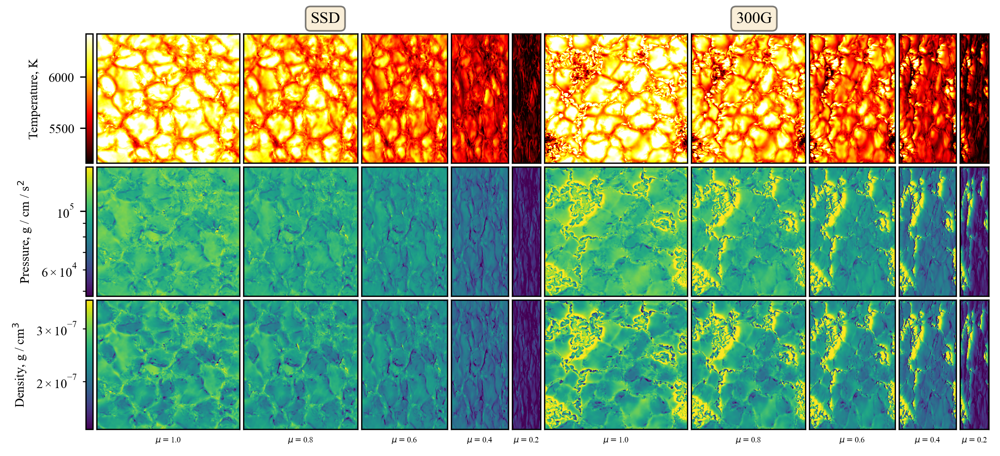

In [21]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'
colormap3 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(10, 4.5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(3, 11, width_ratios = [0.05, 1, 0.8, 0.6, 0.4, 0.2, 1, 0.8, 0.6, 0.4, 0.2], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])
dens_cbar = plt.subplot(gs[2, 0])

for i in range(1, 6):

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, i])
    ssd_pres = plt.subplot(gs[1, i])
        
    ssd_dens = plt.subplot(gs[2, i])
        
    if i == 2: ssd_temp.text(300, 600, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_pres.set_xlim(0, 511)
    ssd_pres.set_ylim(0, 511)
        
    ssd_dens.set_xlim(0, 511)
    ssd_dens.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_pres.xaxis.set_ticklabels([])
    ssd_pres.yaxis.set_ticklabels([])
        
    ssd_dens.xaxis.set_ticklabels([])
    ssd_dens.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])
    
    ssd_pres.xaxis.set_ticks([])
    ssd_pres.yaxis.set_ticks([])
        
    ssd_dens.xaxis.set_ticks([])
    ssd_dens.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 5 + i])
    mag_pres = plt.subplot(gs[1, 5 + i])
        
    mag_dens = plt.subplot(gs[2, 5 + i])
        
    if i == 2: mag_temp.text(200, 600, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_pres.set_xlim(0, 511)
    mag_pres.set_ylim(0, 511)
        
    mag_dens.set_xlim(0, 511)
    mag_dens.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])
        
    mag_pres.xaxis.set_ticklabels([])
    mag_pres.yaxis.set_ticklabels([])
        
    mag_dens.xaxis.set_ticklabels([])
    mag_dens.yaxis.set_ticklabels([])
        
    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])
    
    mag_pres.xaxis.set_ticks([])
    mag_pres.yaxis.set_ticks([])
        
    mag_dens.xaxis.set_ticks([])
    mag_dens.yaxis.set_ticks([])
        
#----------------------------------------------
        
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    dnorm = colors.LogNorm(vmin = dmin, vmax = dmax)
        
#    if j == 7: mpnorm = MidPointLogNorm(vmin = rmin, vmax = rmax, midpoint = 1)
#    if j != 7: mpnorm = colors.TwoSlopeNorm(vmin = rmin, vmax = rmax, vcenter = 1)
    
    ssd_temp_img = ssd_temp.imshow(T_ssd[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    ssd_pres_img = ssd_pres.imshow(p_ssd[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    ssd_dens_img = ssd_dens.imshow(d_ssd[i - 1, :, :], cmap = colormap3, norm = dnorm, aspect = 'auto')
        
    mag_temp_img = mag_temp.imshow(T_300[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_pres_img = mag_pres.imshow(p_300[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    mag_dens_img = mag_dens.imshow(d_300[i - 1, :, :], cmap = colormap3, norm = dnorm, aspect = 'auto')
    
    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
    pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
    dens_cb = Colorbar(ax = dens_cbar, mappable = ssd_dens_img, orientation = 'vertical', ticklocation = 'left')
        
    ssd_dens.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
    mag_dens.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)
dens_cb.set_label(r'Density, g / cm$^3$', labelpad = 5)

plt.savefig('intro_full.pdf', bbox_inches = 'tight')

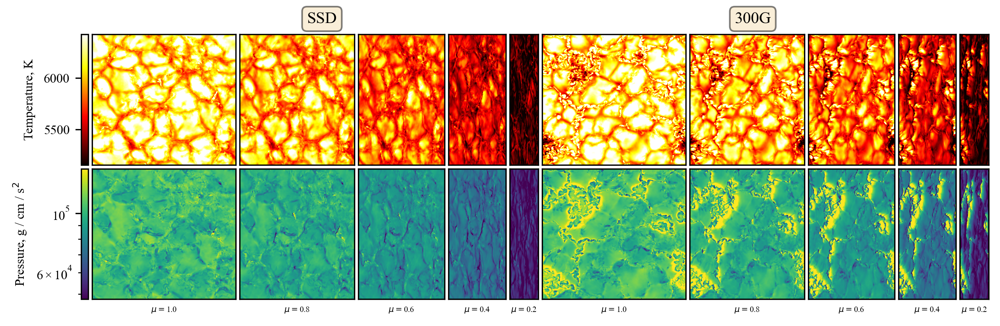

In [25]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(10, 3.0, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 11, width_ratios = [0.05, 1, 0.8, 0.6, 0.4, 0.2, 1, 0.8, 0.6, 0.4, 0.2], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

for i in range(1, 6):

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, i])
    ssd_pres = plt.subplot(gs[1, i])
        
    if i == 2: ssd_temp.text(300, 600, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_pres.set_xlim(0, 511)
    ssd_pres.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_pres.xaxis.set_ticklabels([])
    ssd_pres.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])
    
    ssd_pres.xaxis.set_ticks([])
    ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 5 + i])
    mag_pres = plt.subplot(gs[1, 5 + i])
        
    if i == 2: mag_temp.text(200, 600, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_pres.set_xlim(0, 511)
    mag_pres.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])
        
    mag_pres.xaxis.set_ticklabels([])
    mag_pres.yaxis.set_ticklabels([])
        
    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])
    
    mag_pres.xaxis.set_ticks([])
    mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
    ssd_temp_img = ssd_temp.imshow(T_ssd[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    ssd_pres_img = ssd_pres.imshow(p_ssd[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
        
    mag_temp_img = mag_temp.imshow(T_300[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_pres_img = mag_pres.imshow(p_300[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    
    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
    pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
    ssd_pres.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
    mag_pres.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

plt.savefig('intro_img_1.pdf', bbox_inches = 'tight')

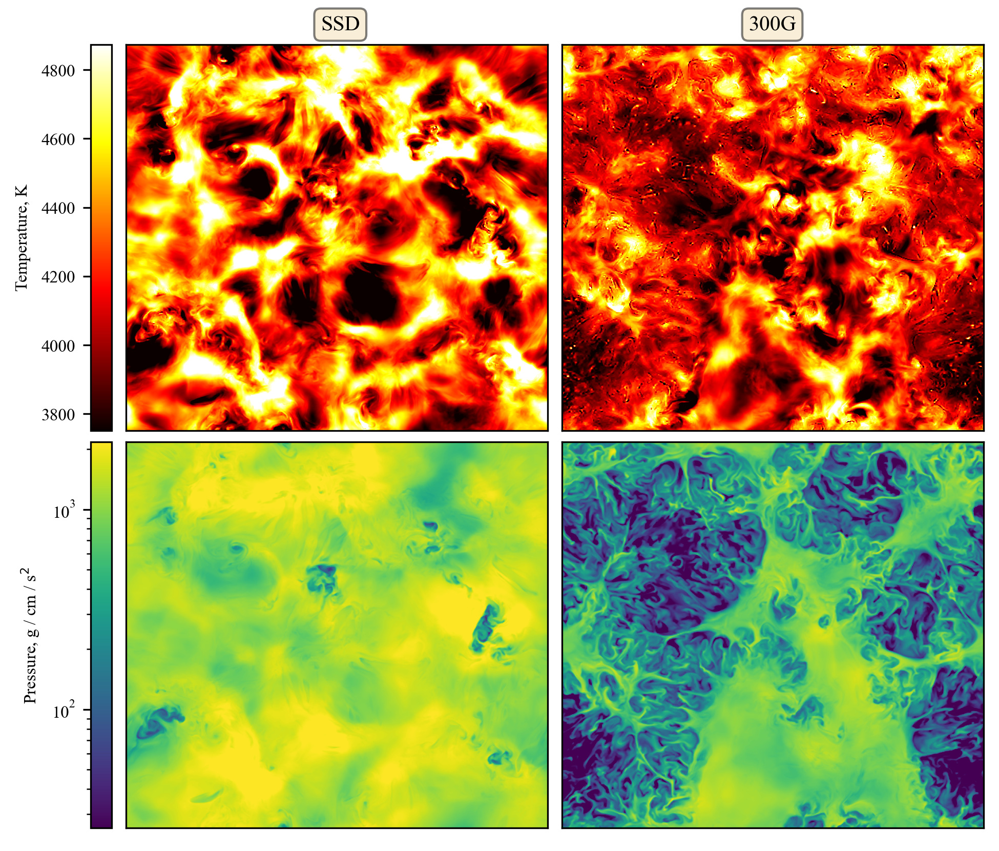

In [70]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(7.5, 11.25 * 3 / 5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 3, width_ratios = [0.05, 1, 1], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

#------------------------------------------
# settings for SSD

ssd_temp = plt.subplot(gs[0, 1])
ssd_pres = plt.subplot(gs[1, 1])
        
ssd_temp.text(236, 550, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

ssd_temp.set_xlim(0, 511)
ssd_temp.set_ylim(0, 511)

ssd_pres.set_xlim(0, 511)
ssd_pres.set_ylim(0, 511)

ssd_temp.xaxis.set_ticklabels([])
ssd_temp.yaxis.set_ticklabels([])
        
ssd_pres.xaxis.set_ticklabels([])
ssd_pres.yaxis.set_ticklabels([])
        
ssd_temp.xaxis.set_ticks([])
ssd_temp.yaxis.set_ticks([])
    
ssd_pres.xaxis.set_ticks([])
ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

mag_temp = plt.subplot(gs[0, 2])
mag_pres = plt.subplot(gs[1, 2])
        
mag_temp.text(226, 550, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

mag_temp.set_xlim(0, 511)
mag_temp.set_ylim(0, 511)

mag_pres.set_xlim(0, 511)
mag_pres.set_ylim(0, 511)

mag_temp.xaxis.set_ticklabels([])
mag_temp.yaxis.set_ticklabels([])
        
mag_pres.xaxis.set_ticklabels([])
mag_pres.yaxis.set_ticklabels([])
        
mag_temp.xaxis.set_ticks([])
mag_temp.yaxis.set_ticks([])
    
mag_pres.xaxis.set_ticks([])
mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
ssd_temp_img = ssd_temp.imshow(T_ssd, cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
ssd_pres_img = ssd_pres.imshow(p_ssd, cmap = colormap2, norm = pnorm, aspect = 'auto')
        
mag_temp_img = mag_temp.imshow(T_300, cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
mag_pres_img = mag_pres.imshow(p_300, cmap = colormap2, norm = pnorm, aspect = 'auto')
    
temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

plt.savefig('intro_img_1_mean_z_p5_95.pdf', bbox_inches = 'tight')